In [3]:
pip install pytorch_fid

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 1.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [4]:
import os

import glob

import random

import numpy as np

from PIL import Image, ImageChops

from skimage.color import rgb2lab

import torch

import torch.nn as nn

import torch.optim as optim

from torchvision import transforms

from torch.utils.data import Dataset, DataLoader

from torchvision.transforms.functional import resize

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split



from skimage.color import rgb2lab, deltaE_cie76

from skimage.metrics import structural_similarity as ssim

from skimage.metrics import peak_signal_noise_ratio as psnr

from pytorch_fid import fid_score

import lpips

from torchvision.transforms.functional import to_pil_image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
def is_greyscale(im):

    """Check if image is monochrome (1 channel or 3 identical channels)."""

    if isinstance(im, str):

        im = Image.open(im).convert("RGB")

    if im.mode not in ("L", "RGB"):

        raise ValueError("Unsupported image mode")

    if im.mode == "RGB":

        rgb = im.split()

        if ImageChops.difference(rgb[0], rgb[1]).getextrema()[1] != 0:

            return False

        if ImageChops.difference(rgb[0], rgb[2]).getextrema()[1] != 0:

            return False

    return True





class Dataset(Dataset):

    def __init__(self, paths, split='train', img_size=256):

        self.img_size = img_size  # Default image size

        self.resize = transforms.Resize((self.img_size, self.img_size), Image.BICUBIC)



        # Define transformations for training and validation

        if split == 'train':

            self.transforms = transforms.Compose([

                transforms.RandomHorizontalFlip(),

                transforms.ColorJitter(brightness=0.3, contrast=0.1, saturation=(1., 2.), hue=0.05),

                self.resize

            ])

        elif split == 'val':

            self.transforms = self.resize

        self.paths = paths



    def tensor_to_lab(self, base_img_tens):

        """Convert RGB image tensor to LAB color space tensor."""

        base_img = np.array(base_img_tens)

        img_lab = rgb2lab(base_img).astype("float32")

        img_lab = transforms.ToTensor()(img_lab)

        L = img_lab[[0], ...] / 50. - 1.  # L channel: normalize to -1 to 1

        ab = img_lab[[1, 2], ...] / 110.  # AB channels: normalize to -1 to 1

        return L, ab



    def get_lab_from_path(self, path):

        """Load image and convert to LAB."""

        img = Image.open(path).convert("RGB")

        img = self.transforms(img)

        L, ab = self.tensor_to_lab(img)

        return L, ab



    def __getitem__(self, idx):

        """Get a single sample (L and AB channels separately)."""

        return self.get_lab_from_path(self.paths[idx])



    def __len__(self):

        """Get the length of the dataset."""

        return len(self.paths)



def restore_to_original_size(img, original_size):

    """Restore image to its original size."""

    return resize(img, original_size)


In [6]:
def make_datasets(path, img_size=256, limit=None):

    """Create training and validation datasets."""

    img_paths = glob.glob(path + "/*")

    if limit:

        img_paths = random.sample(img_paths, limit)

    n_imgs = len(img_paths)

    train_split = img_paths[:int(n_imgs * .8)]

    val_split = img_paths[int(n_imgs * .8):]



    train_dataset = Dataset(train_split, split="train", img_size=img_size)

    val_dataset = Dataset(val_split, split="val", img_size=img_size)

    print(f"Train size: {len(train_split)}")

    print(f"Val size: {len(val_split)}")

    return train_dataset, val_dataset





def make_dataloaders(path, batch_size=16, num_workers=2, pin_memory=True, shuffle=True, img_size=256, limit=None):

    """Create DataLoader for training and validation datasets."""

    train_dataset, val_dataset = make_datasets(path, img_size=img_size, limit=limit)



    train_dl = DataLoader(train_dataset,

                          batch_size=batch_size,

                          num_workers=num_workers,

                          pin_memory=pin_memory,

                          persistent_workers=True,

                          shuffle=shuffle)



    val_dl = DataLoader(val_dataset,

                        batch_size=batch_size,

                        num_workers=num_workers,

                        pin_memory=pin_memory,

                        persistent_workers=True,

                        shuffle=shuffle)

    return train_dl, val_dl

In [7]:
x = make_datasets(path='/kaggle/input/pascal-voc-2012/VOC2012/JPEGImages', img_size=256, limit=None)

Train size: 13700
Val size: 3425


In [8]:
x[0]

In [9]:
x[0][0][0]

tensor([[[-0.1013,  0.1806,  0.1794,  ...,  0.7707,  0.8095,  0.7993],
         [-0.0654,  0.2094,  0.1801,  ...,  0.7866,  0.7959,  0.7818],
         [-0.1047,  0.1674,  0.1287,  ...,  0.7787,  0.7991,  0.8057],
         ...,
         [-0.5648, -0.3190, -0.3513,  ...,  0.4262,  0.4521,  0.4327],
         [-0.5507, -0.3102, -0.3554,  ...,  0.4200,  0.4546,  0.4399],
         [-0.5588, -0.3309, -0.3655,  ...,  0.4145,  0.4419,  0.4329]]])

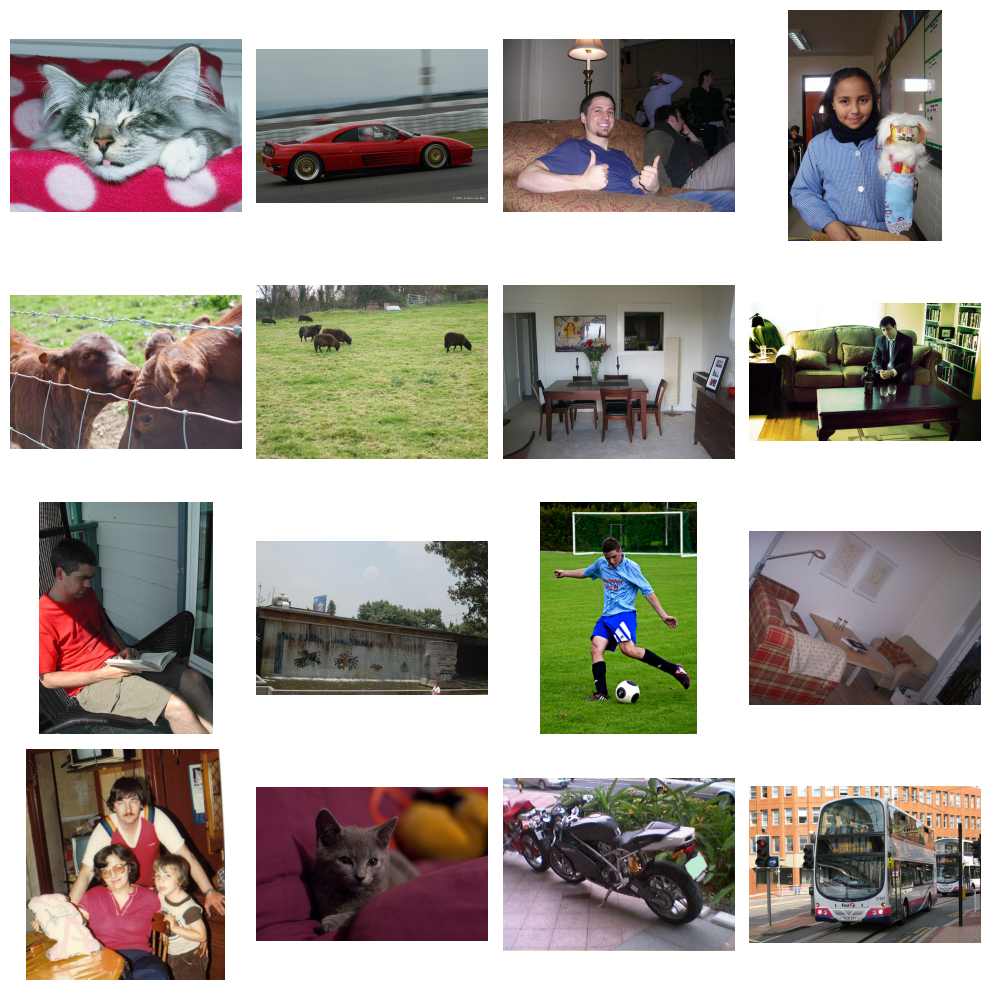

In [10]:
path = '/kaggle/input/pascal-voc-2012/VOC2012/JPEGImages'



all_image_paths = sorted([os.path.join(path, img) for img in os.listdir(path) if img.endswith('.jpg')])

image_paths = all_image_paths[:10000]

train_paths, val_paths = train_test_split(image_paths, test_size=0.2, random_state=42)



_, axes = plt.subplots(4, 4, figsize=(10, 10))

for ax, img_path in zip(axes.flatten(), train_paths[:16]):

    ax.imshow(Image.open(img_path))

    ax.axis("off")

plt.tight_layout()

plt.show()

In [11]:
train_dl, val_dl = make_dataloaders(path=path, batch_size=16, num_workers=2, pin_memory=True, shuffle=True, img_size=256, limit=None)

for l, ab in train_dl:

    print(f"L_channel shape: {l.shape}")

    print(f"AB_channels shape: {ab.shape}")

    break

Train size: 13700
Val size: 3425
L_channel shape: torch.Size([16, 1, 256, 256])
AB_channels shape: torch.Size([16, 2, 256, 256])


In [12]:
class UNet(nn.Module):

    def __init__(self, in_channels=1, out_channels=2, features=[64, 128, 256, 512]):

        super(UNet, self).__init__()

        self.encoder = nn.ModuleList()

        self.decoder = nn.ModuleList()

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)



        # Encoder part

        for feature in features:

            self.encoder.append(self._block(in_channels, feature))

            in_channels = feature



        # Decoder part (Upsampling)

        for feature in reversed(features):

            self.decoder.append(nn.ConvTranspose2d(feature * 2, feature, kernel_size=2, stride=2))

            self.decoder.append(self._block(feature * 2, feature))



        # Final Convolution

        self.bottleneck = self._block(features[-1], features[-1] * 2)

        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)



    def forward(self, x, t):

        skip_connections = []



        # Encode

        for layer in self.encoder:

            x = layer(x)

            skip_connections.append(x)

            x = self.pool(x)



        # Bottleneck

        x = self.bottleneck(x)



        # Decode

        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.decoder), 2):

            x = self.decoder[idx](x)

            skip_connection = skip_connections[idx // 2]

            x = torch.cat((x, skip_connection), dim=1)  # Skip connection

            x = self.decoder[idx + 1](x)



        return self.final_conv(x)



    def _block(self, in_channels, out_channels):

        return nn.Sequential(

            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),

            nn.BatchNorm2d(out_channels),

            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),

            nn.BatchNorm2d(out_channels),

            nn.ReLU(inplace=True),

        )

In [13]:
# Autoencoder model placeholder

class Autoencoder(nn.Module):

    def __init__(self, model):

        super(Autoencoder, self).__init__()

        self.model = model



    def forward(self, x, t):

        return self.model(x, t)

In [ ]:
from torchvision.transforms.functional import to_pil_image

from skimage.color import lab2rgb

def lab_to_rgb(L, ab):

    """

    Takes a batch of images

    """



    L = (L + 1.) * 50.

    ab = ab * 110.

    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()

    rgb_imgs = []

    for img in Lab:

        img_rgb = lab2rgb(img)

        rgb_imgs.append(img_rgb)

    return np.stack(rgb_imgs, axis=0)



def visualize_colorization(model, dataloader):

    model.eval()  # Put the model into evaluation mode

    device = next(model.parameters()).device  # Get the equipment of the model



    with torch.no_grad():

        for data in dataloader:

            # Assume the data is a tuple (L_channel, AB_channels)

            L, ab = data

            L, ab = L.to(device), ab.to(device)



            # Create a fake color photo from the model

            t = torch.tensor([0]).to(device)  # Time t

            colorized_img = model(L, t)  # Predicted color channel from the model



            # Switch from LAB to RGB for visualization

            colorized_rgb = lab_to_rgb(L, colorized_img)

            original_rgb = lab_to_rgb(L, ab)



            # Show 5 photos (or less if batch size < 5)

            batch_size = L.size(0)

            num_images = min(5, batch_size)

            fig = plt.figure(figsize=(15, 8))



            for i in range(num_images):

                # Brightness channel display (L channel)

                ax = plt.subplot(3, num_images, i + 1)

                ax.imshow(L[i][0].cpu(), cmap='gray')  # The L channel is a grayscale image

                ax.axis("off")

                ax.set_title("Grayscale (L)")



                # Display a colorized image from the model

                ax = plt.subplot(3, num_images, i + 1 + num_images)

                ax.imshow(colorized_rgb[i])

                ax.axis("off")

                ax.set_title("Colorized")



                # Displaying original color images from the original data

                ax = plt.subplot(3, num_images, i + 1 + 2 * num_images)

                ax.imshow(original_rgb[i])

                ax.axis("off")

                ax.set_title("Original")



            plt.show()

            break

In [ ]:
os.makedirs("checkpoints", exist_ok=True)

os.makedirs("results", exist_ok=True)



def train_autoencoder(model, dataloader, optimizer, scheduler, epochs=10):

    model.train()  

    best_fid = float('inf')  



    for epoch in range(epochs):

        total_loss = 0

        for data in tqdm(dataloader, desc=f"Epoch [{epoch + 1}/{epochs}]"):

            L, ab = data  # (L_channel, AB_channels)


            L = L.to(device)

            ab = ab.to(device)



            # Compute loss

            optimizer.zero_grad()



            # Model predict AB channels from L channel

            predicted_ab = model(L, torch.tensor([0]).to(device))  


            # Use criterion (MSELoss) to compute loss between predicted_ab and ground truth (ab)

            loss = criterion(predicted_ab, ab)  # Compute MSE loss between colorized and original image

            loss.backward() 

            optimizer.step()

            total_loss += loss.item()



        scheduler.step()

        avg_loss = total_loss / len(dataloader)

        print(f"Epoch [{epoch + 1}/{epochs}], Loss: {avg_loss:.4f}")



        # Save model after each epoch

        torch.save(model.state_dict(), f"checkpoints/u_epoch_{epoch+1}.pt")

        visualize_colorization(model, dataloader)



    final_model_save_path = "autoencoder.pt"

    torch.save(model.state_dict(), final_model_save_path)

    print(f"Final model saved to {final_model_save_path}")

In [16]:
from tqdm import tqdm



unet = UNet(in_channels=1, out_channels=2).to(device)

model = Autoencoder(unet).to(device)



optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

criterion = nn.MSELoss()

Epoch [1/10]: 100%|██████████| 857/857 [05:37<00:00,  2.54it/s]


Epoch [1/10], Loss: 0.0296


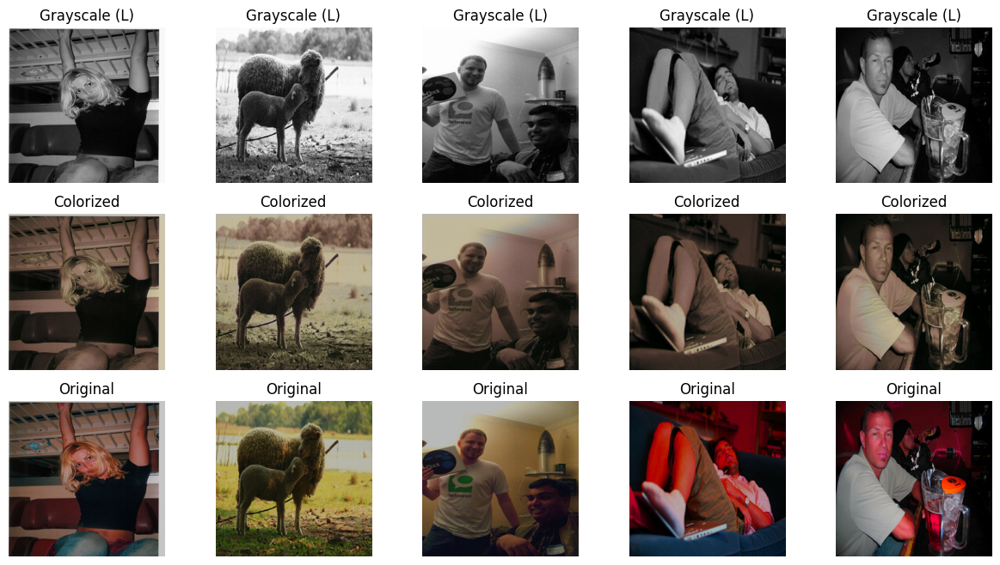

Epoch [2/10]: 100%|██████████| 857/857 [05:15<00:00,  2.72it/s]


Epoch [2/10], Loss: 0.0271


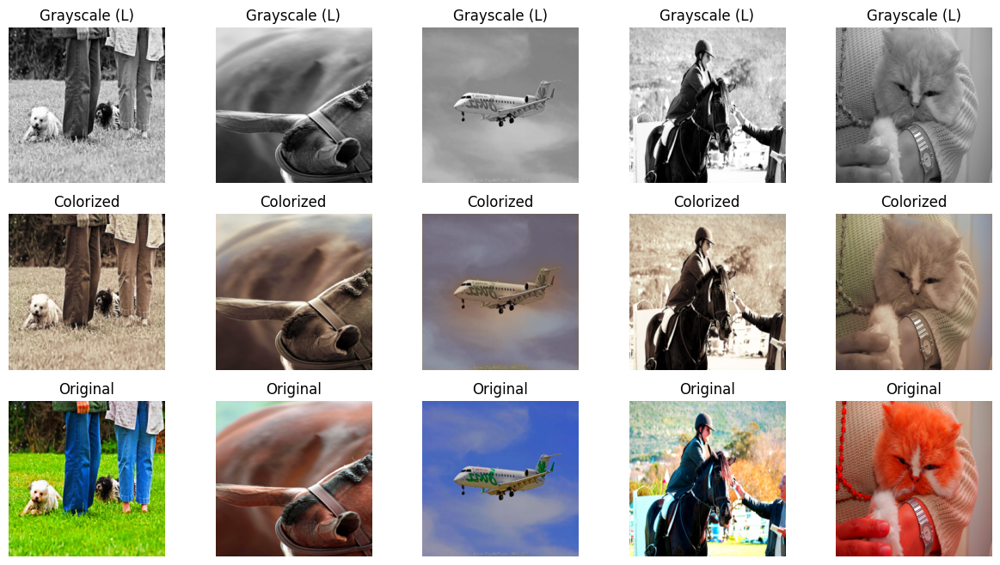

Epoch [3/10]: 100%|██████████| 857/857 [05:15<00:00,  2.72it/s]


Epoch [3/10], Loss: 0.0262


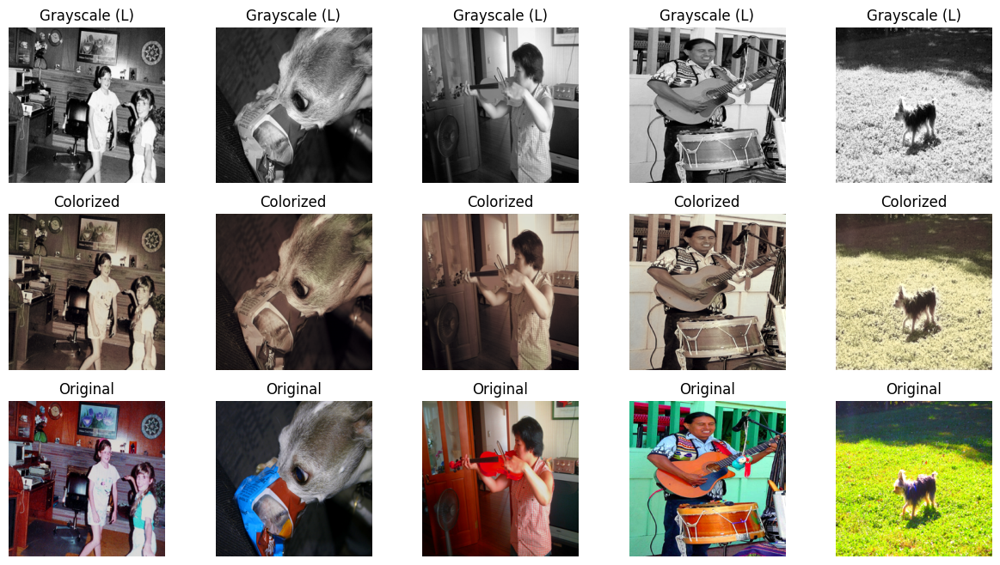

Epoch [4/10]: 100%|██████████| 857/857 [05:15<00:00,  2.72it/s]


Epoch [4/10], Loss: 0.0262


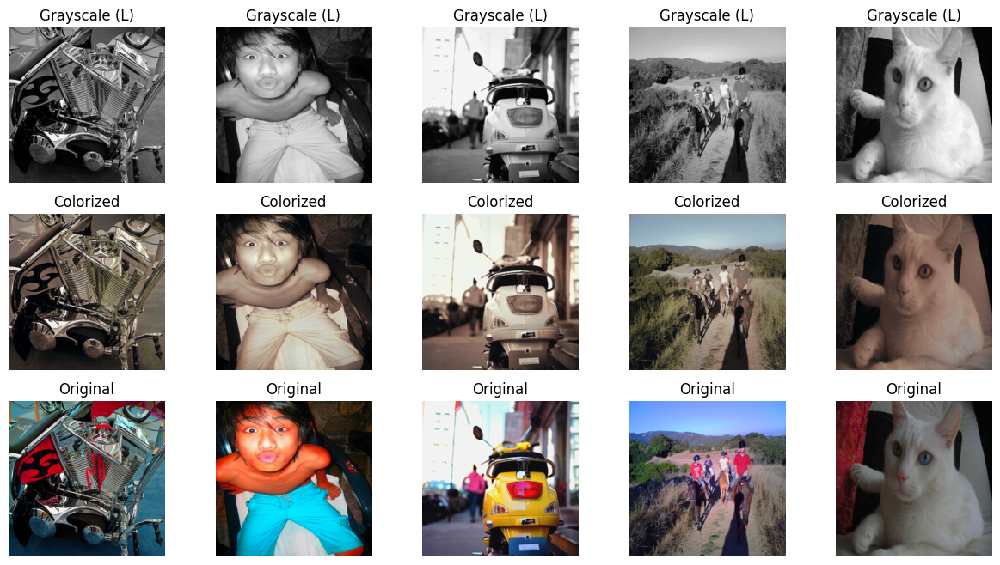

Epoch [5/10]: 100%|██████████| 857/857 [05:15<00:00,  2.72it/s]


Epoch [5/10], Loss: 0.0258


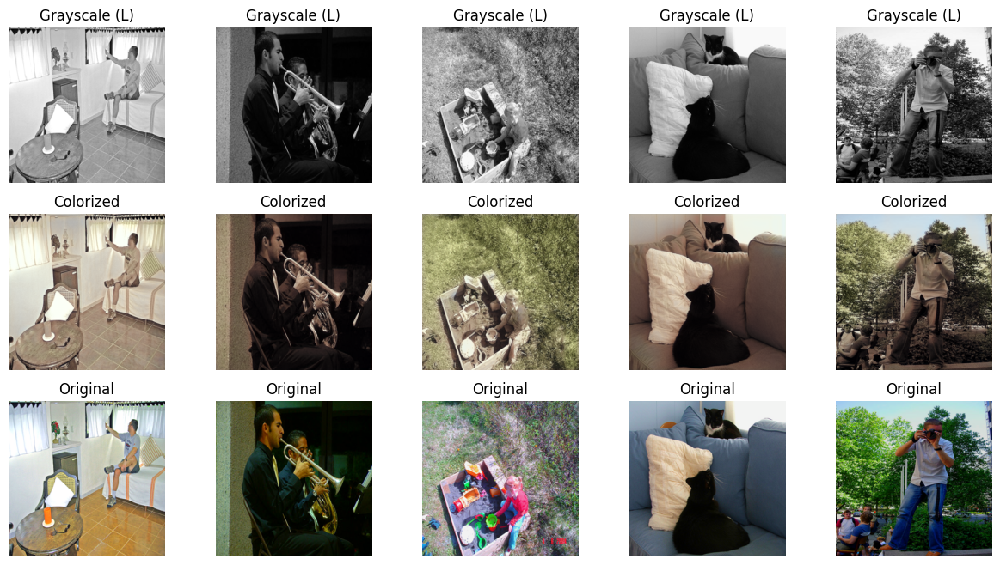

Epoch [6/10]: 100%|██████████| 857/857 [05:14<00:00,  2.72it/s]


Epoch [6/10], Loss: 0.0254


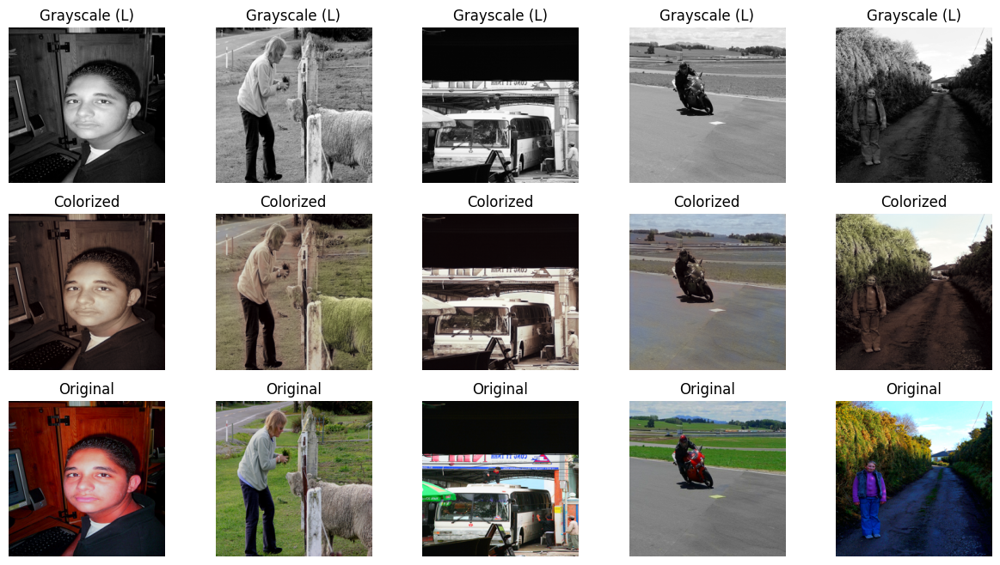

Epoch [7/10]: 100%|██████████| 857/857 [05:14<00:00,  2.72it/s]


Epoch [7/10], Loss: 0.0254


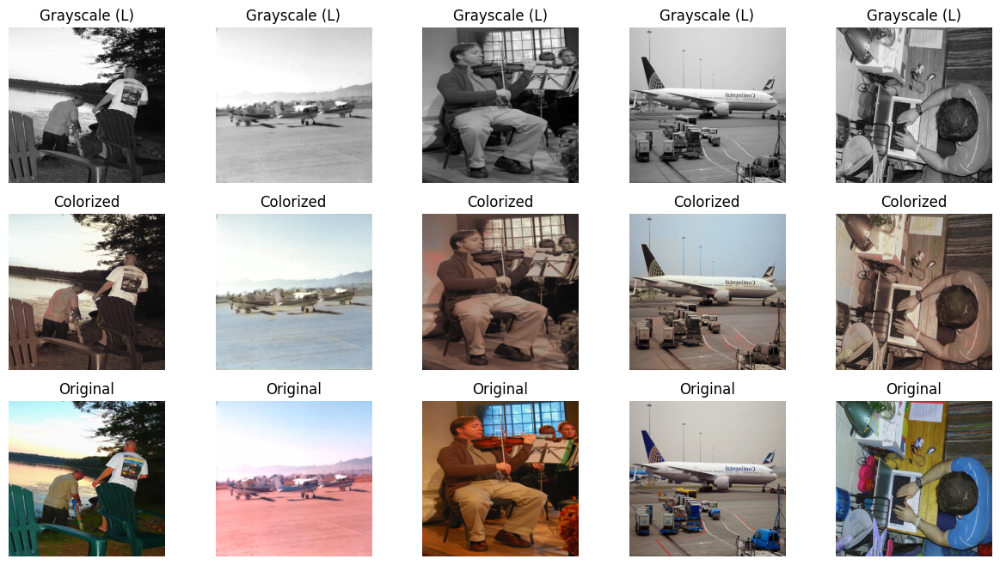

Epoch [8/10]: 100%|██████████| 857/857 [05:14<00:00,  2.72it/s]


Epoch [8/10], Loss: 0.0251


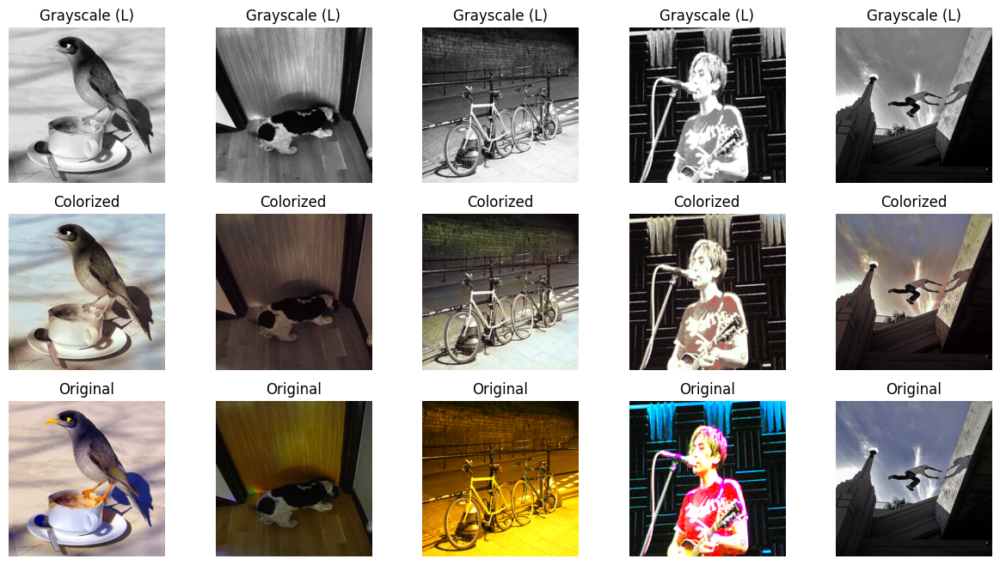

Epoch [9/10]: 100%|██████████| 857/857 [05:14<00:00,  2.72it/s]


Epoch [9/10], Loss: 0.0250


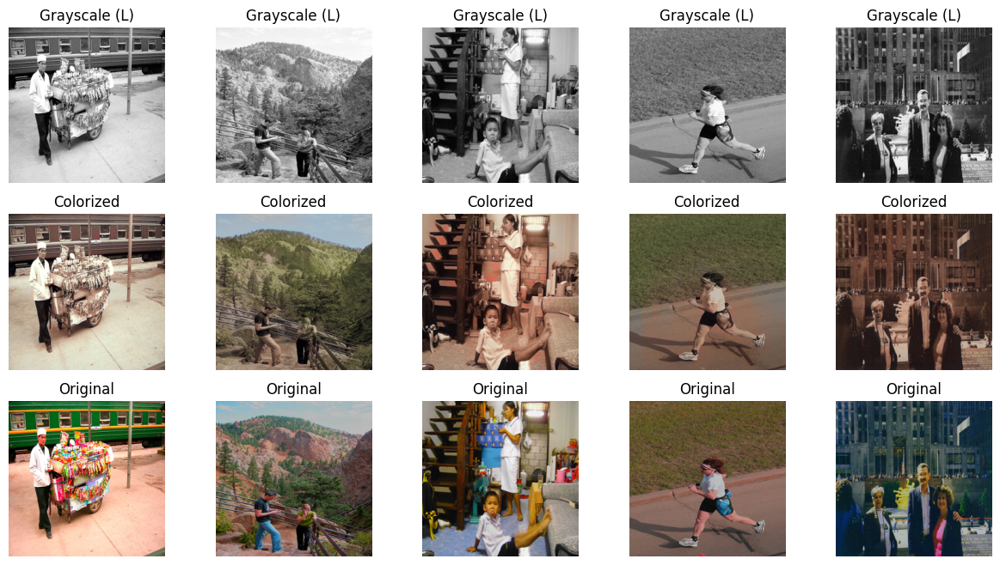

Epoch [10/10]: 100%|██████████| 857/857 [05:14<00:00,  2.72it/s]


Epoch [10/10], Loss: 0.0248


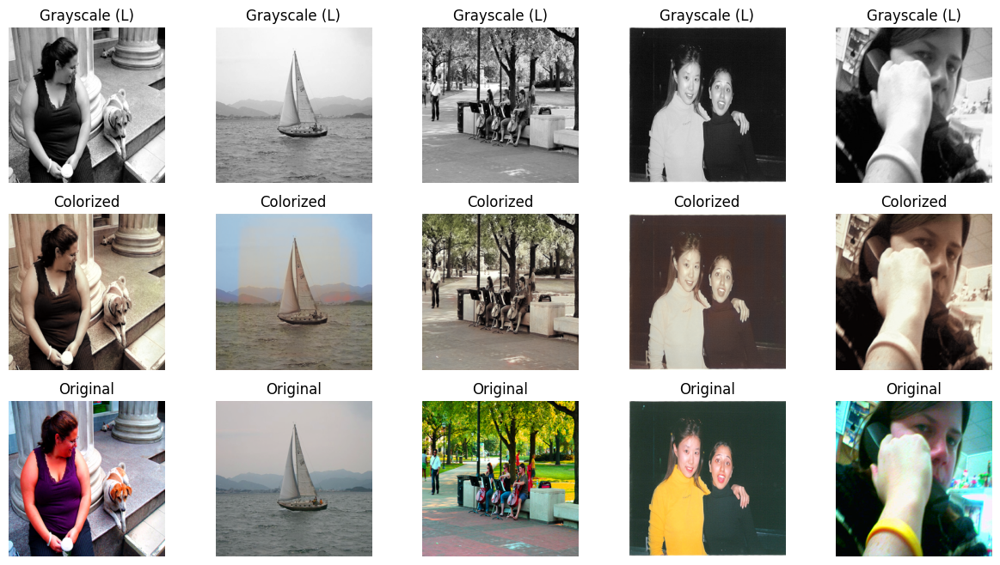

Final model saved to diffusion_final.pt


In [17]:
train_autoencoder(model, train_dl, optimizer, scheduler, epochs=10)

In [72]:
from scipy.linalg import sqrtm
from pytorch_fid import fid_score
from lpips import LPIPS

# Metric: LPIPS
lpips_loss_fn = LPIPS(net='vgg').to(device)

def predict(model, data):
    """Generate colorized images and return them with ground truth."""
    model.eval()
    L, ab = data
    L, ab = L.to(device), ab.to(device)

    with torch.no_grad():
        predicted_ab = model(L, torch.tensor([0]).to(device))
    colorized_rgb = lab_to_rgb(L, predicted_ab)
    original_rgb = lab_to_rgb(L, ab)
    return colorized_rgb, original_rgb

def compute_psnr(img1, img2):
    """Compute PSNR."""
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float("inf")
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

def compute_lpips(img1, img2):
    """Compute LPIPS."""
    img1_tensor = torch.from_numpy(img1).permute(2, 0, 1).unsqueeze(0) / 255.0
    img2_tensor = torch.from_numpy(img2).permute(2, 0, 1).unsqueeze(0) / 255.0
    img1_tensor, img2_tensor = img1_tensor.to(device), img2_tensor.to(device)
    return lpips_loss_fn(img1_tensor, img2_tensor).item()

def evaluate_model(model, val_dl):
    metrics = {"PSNR": [], "LPIPS": [], "FID": None, "Delta_Colorfulness": []}
    real_list, fake_list = [], []

    for data in val_dl:
        fake_imgs, real_imgs = predict(model, data)

        for fake, real in zip(fake_imgs, real_imgs):
            real_scaled = scale_to_255(real)
            fake_scaled = scale_to_255(fake)

            # Metrics
            metrics["PSNR"].append(compute_psnr(real_scaled, fake_scaled))
            metrics["LPIPS"].append(compute_lpips(real_scaled, fake_scaled))
            metrics["Delta_Colorfulness"].append(abs(colorfulness(fake_scaled) - colorfulness(real_scaled)))

            # Collect for FID
            real_list.append(real_scaled)
            fake_list.append(fake_scaled)

    # Compute FID using pytorch_fid
    real_path, fake_path = "real_images", "fake_images"
    os.makedirs(real_path, exist_ok=True)
    os.makedirs(fake_path, exist_ok=True)

    for idx, (real, fake) in enumerate(zip(real_list, fake_list)):
        real_img = Image.fromarray(real)
        fake_img = Image.fromarray(fake)
        real_img.save(os.path.join(real_path, f"{idx}.png"))
        fake_img.save(os.path.join(fake_path, f"{idx}.png"))

    metrics["FID"] = fid_score.calculate_fid_given_paths(
        [real_path, fake_path], batch_size=16, device=device, dims=2048
    )

    # Average metrics
    metrics = {k: (np.mean(v) if isinstance(v, list) else v) for k, v in metrics.items()}
    return metrics


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


In [73]:
results = evaluate_model(model, val_dl)
print("Evaluation Results:")
for metric, value in results.items():
    print(f"{metric}: {value:.4f}")


Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:01<00:00, 64.7MB/s]
100%|██████████| 215/215 [00:13<00:00, 15.43it/s]


Evaluation Results:
PSNR: 30.3846
LPIPS: 0.1322
FID: 22.2742
Delta_Colorfulness: 50.7047
